El objetivo de este jupyter notebook es mostrar todo lo necesario para poder analizar y comprender el proceso realizado para la obtención de los resultados mostrados en el TFG "Interpretability of classification models".

# Explicaciones previas

A continuación comento brevemente algunos conceptos que se han usado en esta parte y que pueden ser interesantes para entender mejor este proceso.

## Random forest

Un **Random Forest** es un poderoso algoritmo de aprendizaje automático utilizado tanto para clasificación como para regresión. Se basa en la combinación de múltiples árboles de decisión para mejorar la precisión y controlar el sobreajuste.

**Componentes Clave**:

1. **Árboles de Decisión**: Un árbol de decisión es un modelo predictivo que toma decisiones basadas en reglas aprendidas a partir de los datos de entrenamiento. Cada árbol en el Random Forest se entrena de manera independiente.

2. **Bootstrap Aggregating (Bagging)**: Para construir el bosque, se utilizan diferentes muestras del conjunto de datos de entrenamiento con reemplazo (bootstrap). Esto significa que cada árbol se entrena con una muestra diferente del conjunto de datos.

3. **Selección Aleatoria de Características**: En cada nodo de un árbol de decisión, en lugar de considerar todas las características posibles para dividir los datos, el algoritmo selecciona aleatoriamente un subconjunto de características. Esto introduce diversidad adicional en los árboles.

4. **Promediado de Resultados**: Para realizar una predicción, el Random Forest promedia (en el caso de regresión) o toma el voto mayoritario (en el caso de clasificación) de las predicciones realizadas por todos los árboles del bosque.

**Ventajas**:

1. **Mejora de la Precisión**: Al combinar múltiples árboles, el Random Forest suele lograr una mayor precisión que los árboles individuales.

2. **Reducción del Sobreajuste**: La técnica de bagging y la selección aleatoria de características ayudan a reducir el riesgo de sobreajuste, haciendo el modelo más robusto.


![Imagen](Imagenes/RandomForest.png)

## Importancia de Características en un Random Forest para Regresión

La importancia de características (**feature importance**) en un modelo de Random Forest para regresión es una métrica que indica la relevancia de cada característica en la predicción del modelo. Este valor se calcula durante el proceso de entrenamiento del Random Forest y se basa en la reducción de la varianza atribuible a cada característica.

**¿Cómo se calcula?**

1. **Construcción de Árboles**: Un Random Forest está compuesto por múltiples árboles de decisión. Cada árbol se entrena utilizando diferentes subconjuntos del conjunto de datos originales.

2. **Reducción de Impureza**: Durante el entrenamiento, cada árbol decide las divisiones (splits) basándose en características individuales para minimizar la impureza (usualmente medida por criterios como el MSE - Mean Squared Error en regresión).

3. **Acumulación de Importancia**: La importancia de cada característica se acumula a lo largo de todas las divisiones en todos los árboles del bosque. En cada división, se registra cuánto se ha reducido la impureza del modelo debido a la característica seleccionada para esa división.

4. **Promedio y Normalización**: Las reducciones de impureza acumuladas para cada característica se promedian y, frecuentemente, se normalizan para que la suma de todas las importancias sea 1 (o 100%).

**Interpretación**

1. **Valores más altos**: Las características con valores de importancia más altos tienen un mayor impacto en la predicción del modelo.

2. **Selección de Características**: Se pueden utilizar estas importancias para realizar selección de características, eliminando aquellas que tienen baja o nula importancia para simplificar el modelo sin sacrificar mucho rendimiento.

![Imagen](Imagenes/FeatureImportance1.png)

![Imagen](Imagenes/FeatureImportance2.jpg)

## Permutation Feature Importance
La Importancia de Característica por Permutación (**Permutation Feature Importance**) es una técnica utilizada para evaluar la importancia de las características en un modelo de machine learning. Funciona midiendo cuánto cambia la **métrica de rendimiento** del modelo cuando los valores de una característica específica se barajan de manera aleatoria, mientras se mantienen fijos los valores de todas las demás características. En otras palabras, mide el **impacto de cada característica en el rendimiento del modelo al perturbarla**.

En el contexto de un **modelo de regresión**, la Permutation Feature Importance se interpreta de la siguiente manera:

1. **Métrica de Rendimiento Base**: Primero, se calcula la métrica de rendimiento del modelo utilizando las características en su estado original. En regresión, esta métrica de rendimiento suele ser el error cuadrático medio (Mean Squared Error, MSE), el error absoluto medio (Mean Absolute Error, MAE) o el coeficiente de determinación (R²).

2. **Perturbación de la Característica**: Luego, se selecciona una característica y se barajan sus valores aleatoriamente en el conjunto de datos, de manera que se rompe la relación entre esta característica y la variable objetivo.

3. **Recalculo de la Métrica**: Se vuelve a calcular la métrica de rendimiento del modelo utilizando el conjunto de datos con la característica perturbada.

4. **Cambio en la Métrica de Rendimiento**: La importancia de la característica se determina midiendo la diferencia entre la métrica de rendimiento original y la métrica de rendimiento con la característica perturbada. Si la perturbación de una característica específica causa un gran deterioro en la métrica de rendimiento del modelo, se considera que esa característica es importante.

**Interpretación de los Valores**

- **Valor Alto de Importancia**: Si la perturbación de una característica lleva a un gran aumento en el MSE (o un gran aumento en MAE, o una gran disminución en R²), significa que la característica es importante para el modelo. Esto indica que la característica tiene una relación significativa con la variable objetivo y su información es crucial para hacer predicciones precisas.

- **Valor Bajo de Importancia**: Si la perturbación de una característica lleva a un cambio pequeño o nulo en la métrica de rendimiento del modelo, significa que la característica tiene poca importancia. Esto sugiere que la característica no aporta mucha información relevante para las predicciones del modelo.

![Imagen](Imagenes/Permutation_Feature_Importance_Graphic.png)

### Partial Dependence Plot (PDP)

**Partial Dependence Plot (PDP)** es una representación gráfica que describe la relación entre una o más variables de entrada y la variable de respuesta en un modelo de regresión. Ayuda a entender cómo una variable o conjunto de variables independientes influyen en la predicción del modelo mientras se mantienen constantes las demás variables.

Las siguientes fórmulas describen el calculo teórico y la estimación de la **función de dependencia parcial**:

![Imagen](Imagenes/PDP_formula.png)

![Imagen](Imagenes/PDP_estimation.png)

## Base de datos usada
La idea de la base de datos y el modelo que vamos a usar es predecir datos que faltan en la base de datos, más específicamente es un problema de regresión. Queremos completar valores faltantes para poder predecir el gasto total de clientes, siendo el total la suma de las tres variables que nos interesan predecir. Por motivos de complejidad vamos a estudiar tres modelos con un único valor faltante por cada uno. 

(explicar lo que me comentó Damián sobre e_civil_median y consultar dudas)

Las variables con las que vamos a trabajar son las siguientes:
- **prest**: ¿cantidad en préstamo?
- **cirbe**: esta variable representa un informe del Banco Central de España.
- **finan**: ¿financiación?
- **entradas_dinero**: esta variable representa las entradas de dinero de un cliente.
- **edad**: del cliente.
- **antiguedad**: del cliente.
- **norm_total_gastos**: gastos conocidos totales del cliente normalizados.
- **e_civil_median**: el cliente puede ser un conjunto de personas, se coge la mediana del estado civil representado numéricamente.
- **provincia_median**: la mediana de los datos que se tienen para la provincia del cliente. 
- **ccaa_median**: la mediana de los datos que se tienen para la comunidad autónoma del cliente. 
- **aut**: si es autónomo.
- **with_dom**: si tiene nómina domiciliada.
- **cirbe_nan**: si no tiene el informe CIRBE o no (en cuyo caso cirbe vale 0).

Las variables que vamos a predecir son las siguientes:
- **recibos**: gastos en recibos.
- **tarj**: gastos en tarjeta.
- **impuestos**: gastos en impuestos.

# Implementación

## Librerias

In [20]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:
import dill
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

In [22]:
from sklearn.ensemble         import RandomForestRegressor
from sklearn.model_selection  import train_test_split
from sklearn.inspection       import permutation_importance
from sklearn.inspection import PartialDependenceDisplay
from alepython import ale_plot
import shap

In [23]:
np.random.seed(42)

## Declaración o carga de algunas variables

In [24]:
all_models = [
    'recibos',
    'tarj',
    'impuestos', 
    'recibos+tarj',
    'recibos+impuestos',
    'tarj+impuestos',
    'recibos+tarj+impuestos',
]
models_to_run = all_models[0:3]

In [25]:
res = {}
with open(f"res_final_mod/res_recibos.pkl", "rb") as dill_file:
    res['recibos'] = dill.load(dill_file)
with open(f"res_final_mod/res_impuestos.pkl", "rb") as dill_file:
    res['impuestos'] = dill.load(dill_file)
with open(f"res_final_mod/res_tarj.pkl", "rb") as dill_file:
    res['tarj'] = dill.load(dill_file)

Trying to unpickle estimator DecisionTreeRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator DecisionTreeRegressor from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.4.2 when using version 1.3.2. This might lead to bre

In [26]:
res['recibos'].keys()

dict_keys(['model', 'params', 'score', 'res_df', 'X_train', 'y_train', 'X_test', 'y_test', 'imp_feat', 'imp_feat_perm'])

## Recibos

In [66]:
X_train = res['recibos']['X_train']
y_train = res['recibos']['y_train']
X_test = res['recibos']['X_test']
y_test = res['recibos']['y_test']

rf = res['recibos']['model']

imp_feat = res['recibos']['imp_feat']
imp_feat_perm = res['recibos']['imp_feat_perm']


### Previsualización de datos

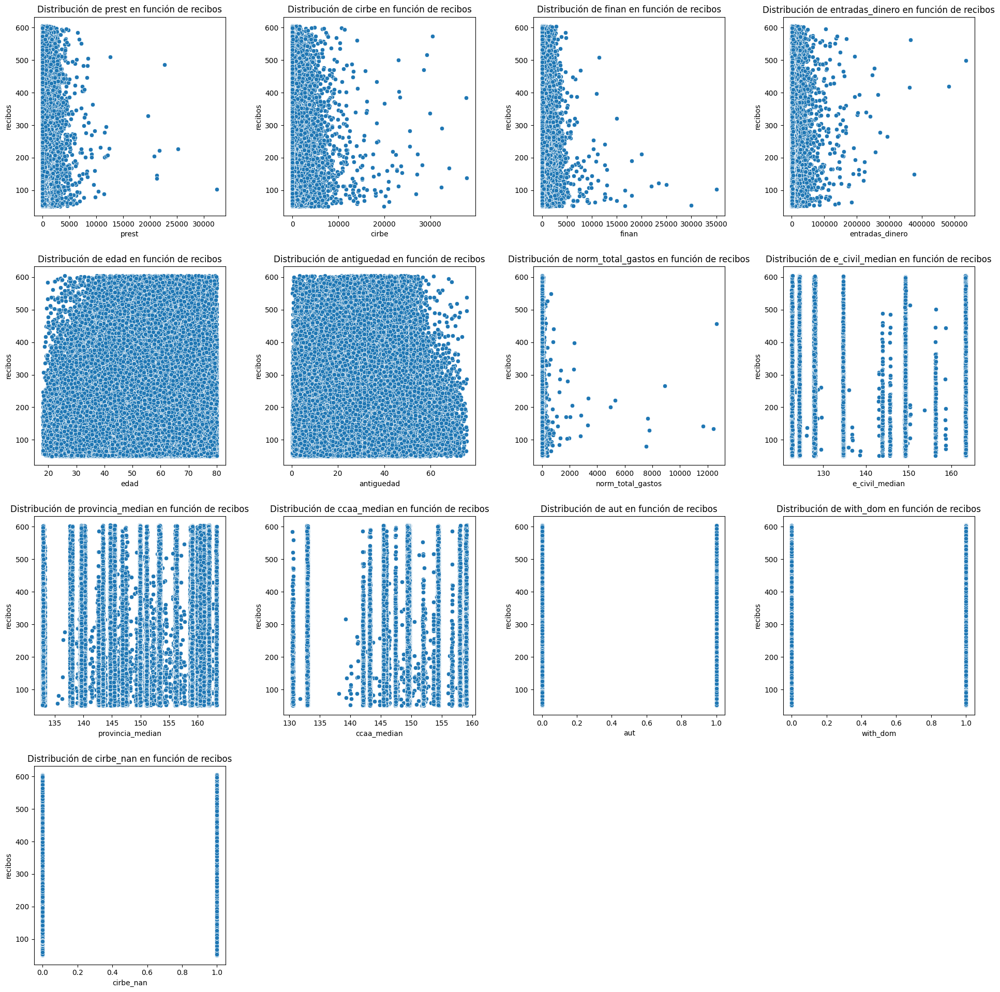

In [28]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['recibos'] = y_train
df = df_train[df_train['prest'] <= 50000]
df = df[df['cirbe'] <= 40000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 1000000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['recibos'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de recibos')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('recibos')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Poco que comentar, vemos que es un problema muy complicado pues no vemos prácticamente ninguna relación entre las variables y el target a predecir.

### Feature Importance

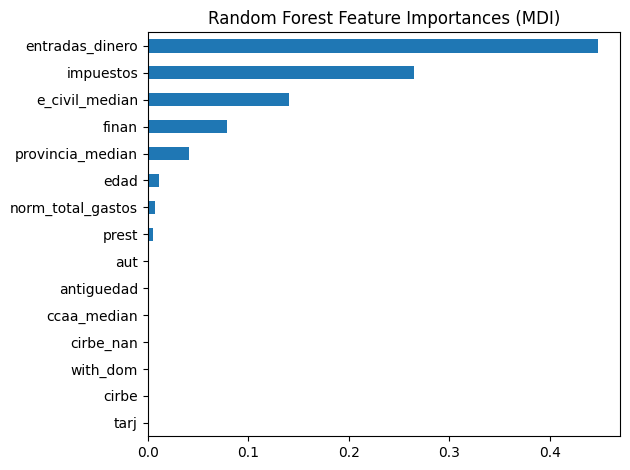

In [29]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

De aquí podemos observar que el modelo predice principalmente en función de las entradas de dinero, los impuestos, el estado civil, la financiación y la provincia.

### Permutation Feature Importance

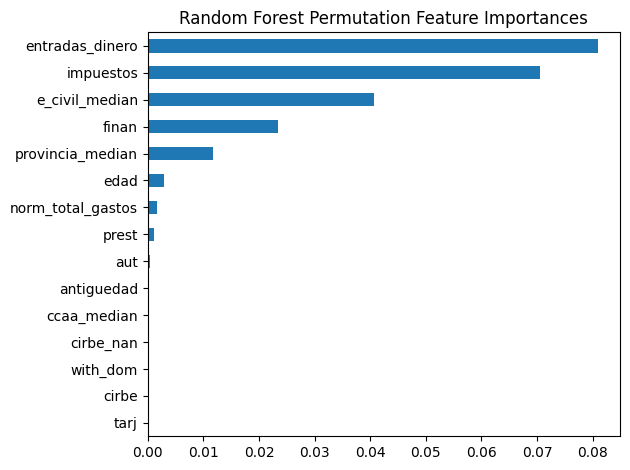

In [30]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Partimos de algo muy importante, las PFI son tan bajas que ya sabemos que el modelo se ajusta muy poco a la realidad.

Sin embargo sí podemos afirmar algo bueno, es muy similar a las feature importance anteriores, lo que significa que el modelo predice de una manera que concuerda con la precisión de los datos. (FI muestra como predice el modelo y PFI que variables son las que afectan más a la precisión de los datos, que coincidan es una señal de que no hay overfitting y que el modelo es coherente). 

### PDP

In [31]:

rf.feature_names_in_

array(['prest', 'tarj', 'cirbe', 'impuestos', 'finan', 'entradas_dinero',
       'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median',
       'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'],
      dtype=object)

Variables a estudiar:

- entradas_dinero --> 5
- impuestos --> 3
- e_civil_median --> 9
- finan --> 4
- provincia_median --> 10
- edad --> 6

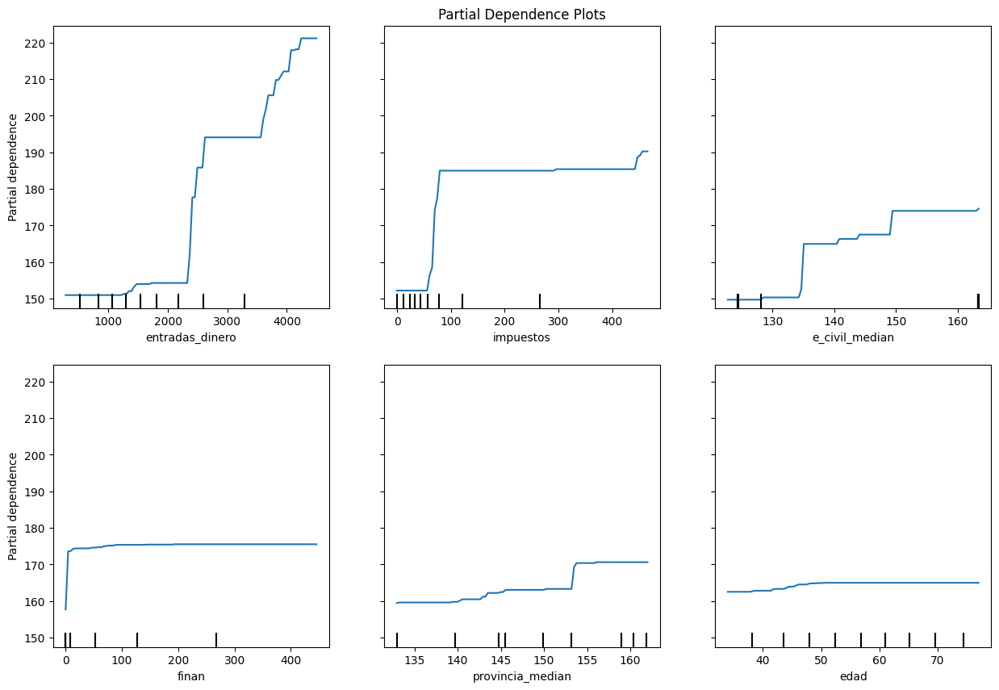

In [32]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(5, 3, 9, 4, 10, 6), # the features to plot
    #categorical_features = [13, 12, 11], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Si observamos las variables más importantes podemos intuir como las utiliza el modelo. No voy a comentar demasiado pues de esto pues SHAP es más fiable/consistente.

### SHAP

In [33]:
shap.initjs()

In [34]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/recibos_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/recibos_shap_values.npy', shap_values)

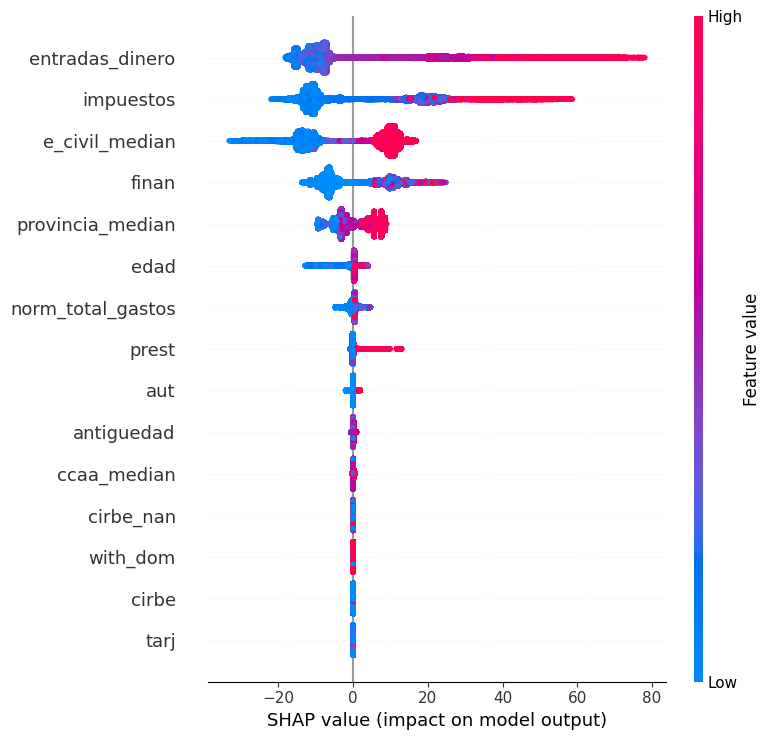

In [35]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Resumen breve, he sido más extenso en impuestos:
- La entrada de dinero es lo que más afecta, hay un grupo denso de valores bajos y luego el modelo usa una relación que debe ser similar a una lineal.
- Los impuestos parece que también afectan de manera similar.
- El estado civil se asemeja más a un tipo categórico.

En general vamos a ver con las gráficas de cada variable específica que están actuando como disparadores, similares a la función de activación de una red neuronal o a la función logística.

In [36]:
import shap

# Suponiendo que ya tienes definidos explainer, shap_values y X_test

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

[Force Plot Recibos](SHAP/recibos_force_plot.html)

In [37]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/recibos_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

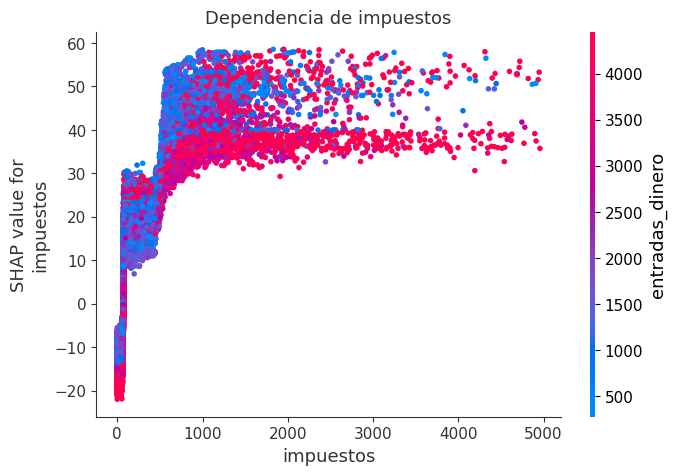

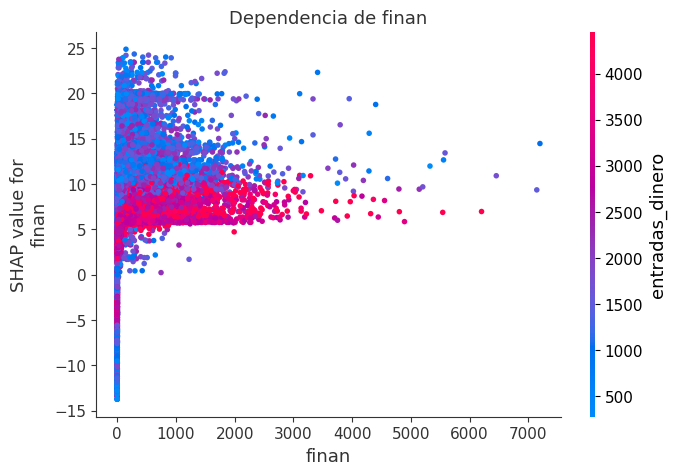

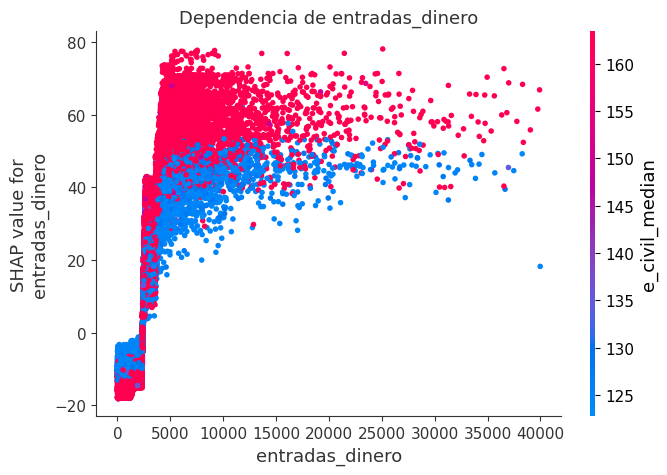

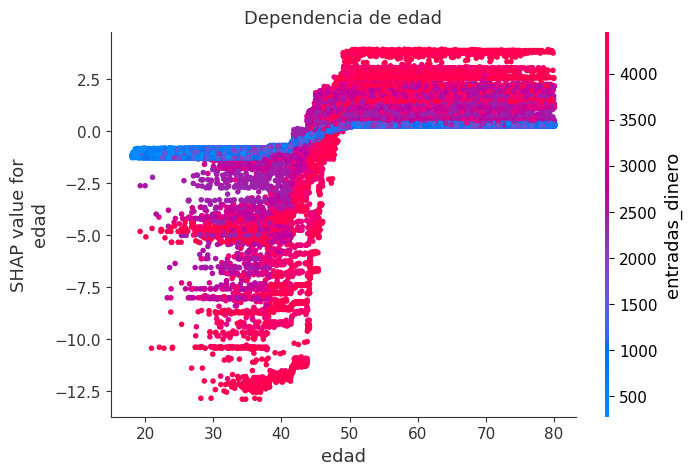

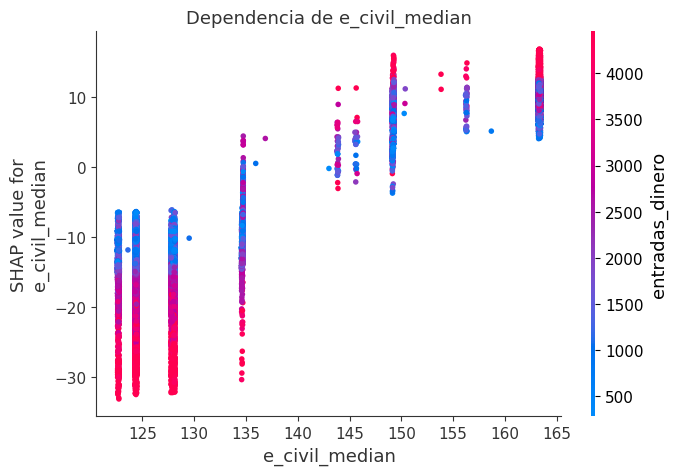

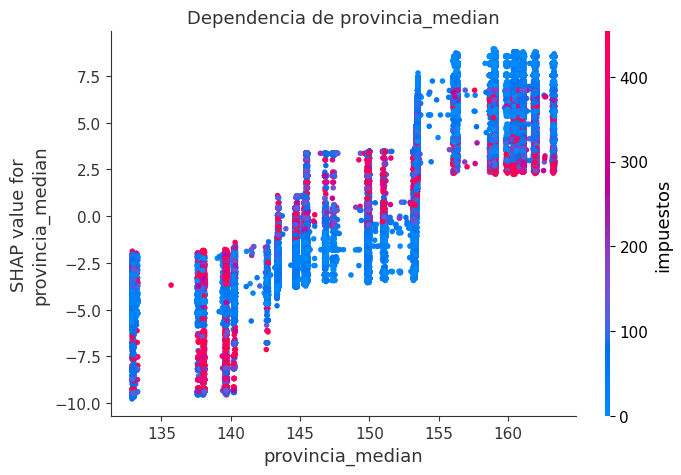

In [67]:
# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['impuestos']<5000]
X_clean = X_clean[X_clean['finan']<7500]
X_clean = X_clean[X_clean['entradas_dinero']<40000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['entradas_dinero','impuestos','e_civil_median','finan','provincia_median','edad']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

## Tarjeta

In [71]:
X_train = res['tarj']['X_train']
y_train = res['tarj']['y_train']
X_test = res['tarj']['X_test']
y_test = res['tarj']['y_test']

rf = res['tarj']['model']

imp_feat = res['tarj']['imp_feat']
imp_feat_perm = res['tarj']['imp_feat_perm']


### Previsualización de datos

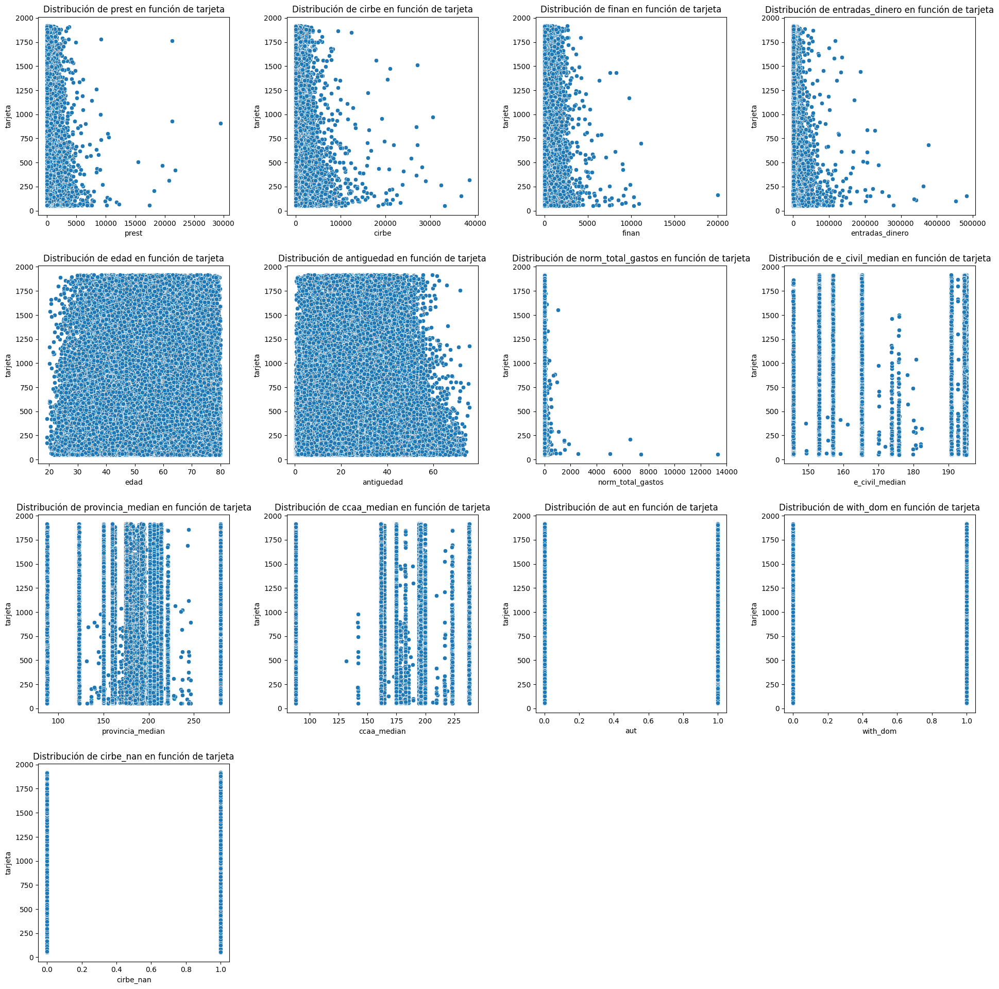

In [72]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['tarj'] = y_train
df = df_train[df_train['prest'] <= 50000]
df = df[df['cirbe'] <= 40000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 1000000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['tarj'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de tarjeta')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('tarjeta')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Igual que antes poca relación entre las variables y el target.

### Feature Importance

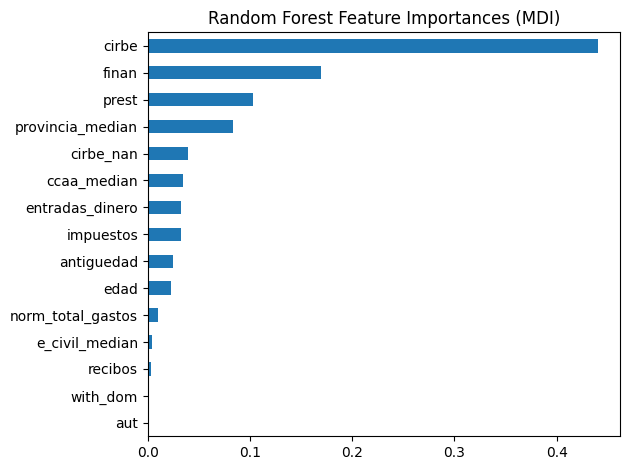

In [73]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

Este modelo tiene en cuenta más variables que el anterior.

### Permutation Feature Importance

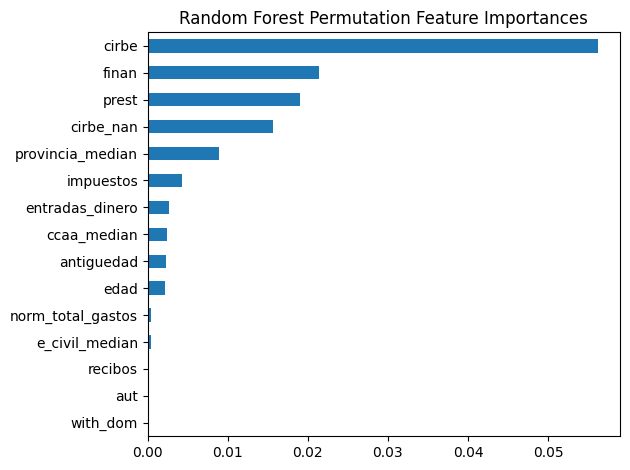

In [74]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Igual que antes, las PFI son tan bajas que ya sabemos que el modelo se ajusta muy poco a la realidad. Como ya  he comentado sí es interesante que la precisión del modelo se ve afectada por más variables.

### PDP

In [75]:

rf.feature_names_in_

array(['prest', 'recibos', 'cirbe', 'impuestos', 'finan',
       'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos',
       'e_civil_median', 'provincia_median', 'ccaa_median', 'aut',
       'with_dom', 'cirbe_nan'], dtype=object)

Variables a estudiar:

- cirbe --> 2
- finan --> 4
- prest --> 0
- ciber_nan --> 14
- provincia_median --> 10
- impuestos --> 3

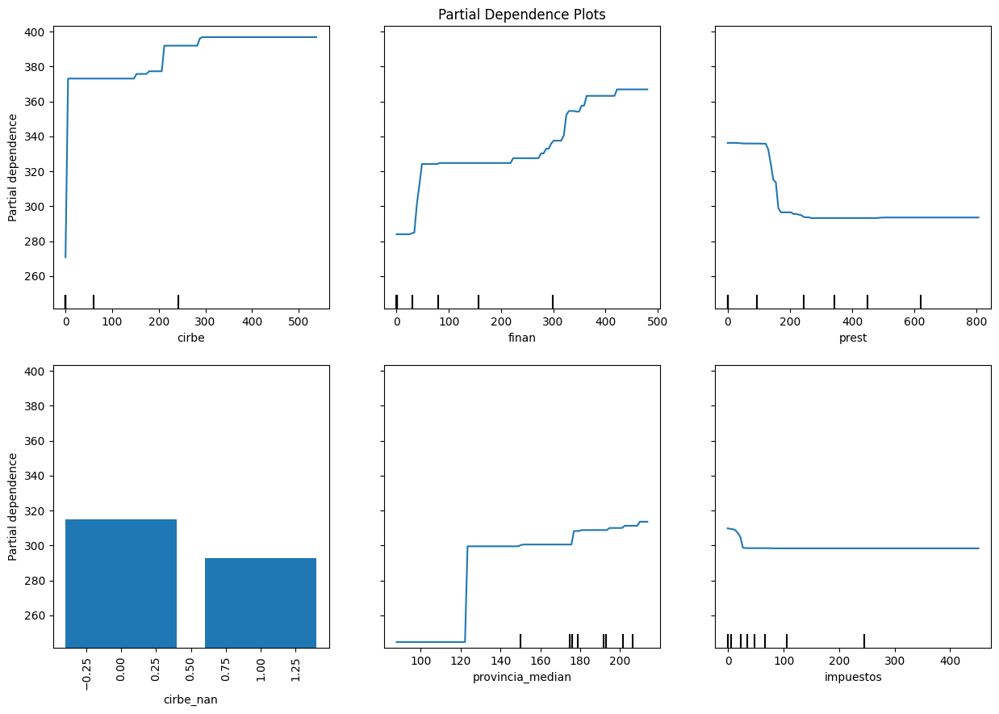

In [76]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(2, 4, 0, 14, 10, 3), # the features to plot
    categorical_features = [False]*14+[True], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Vemos como en el otro modelo la misma tendencia que antes a los escalones en los PDP.

### SHAP

In [77]:
shap.initjs()

In [78]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/tarj_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/tarj_shap_values.npy', shap_values)

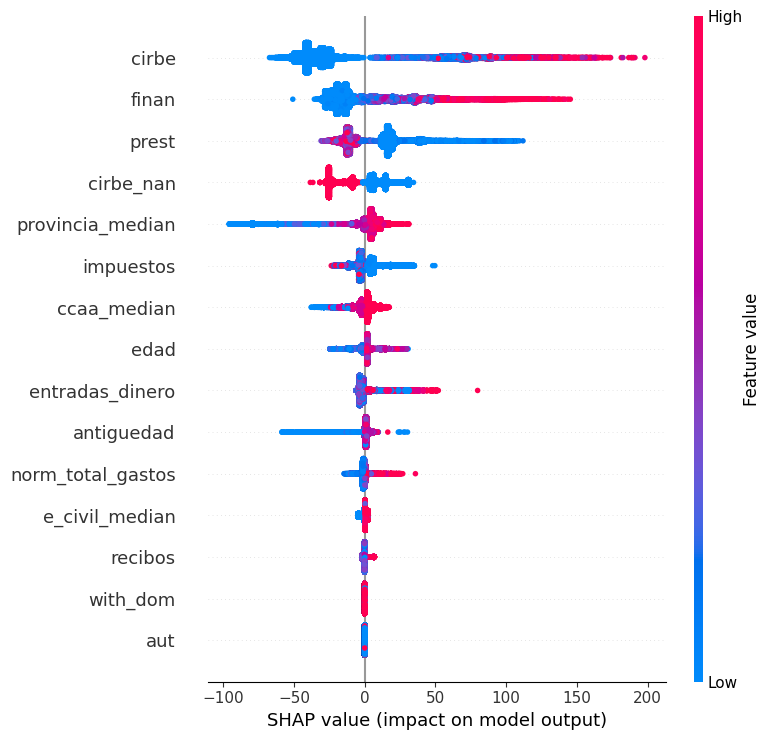

In [79]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Salvo para prest e impuestos la interpretación es sencilla.

In [80]:
#shap.force_plot(explainer.expected_value[0], shap_values, X_test)

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

[Force Plot Tarjetas](SHAP/tarj_force_plot.html)

In [81]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/tarj_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

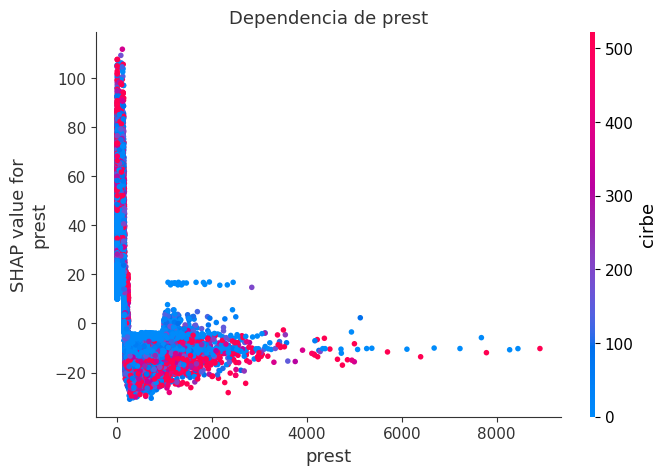

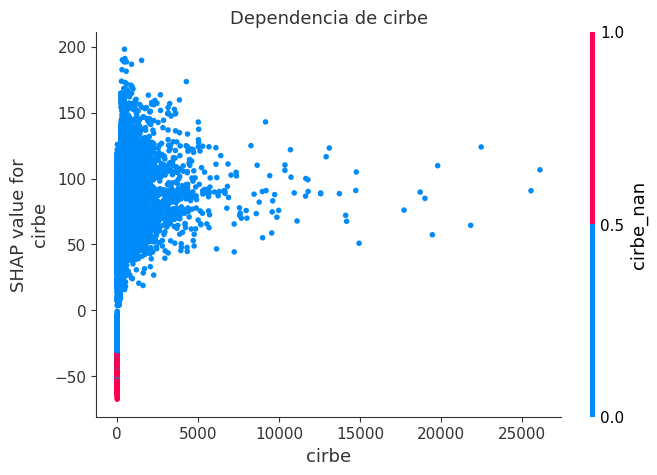

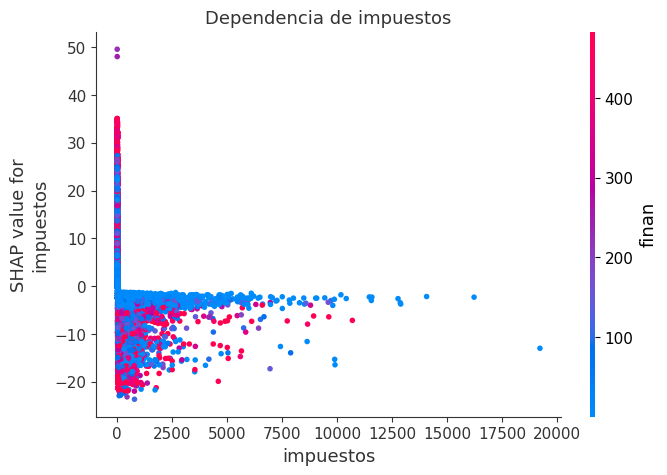

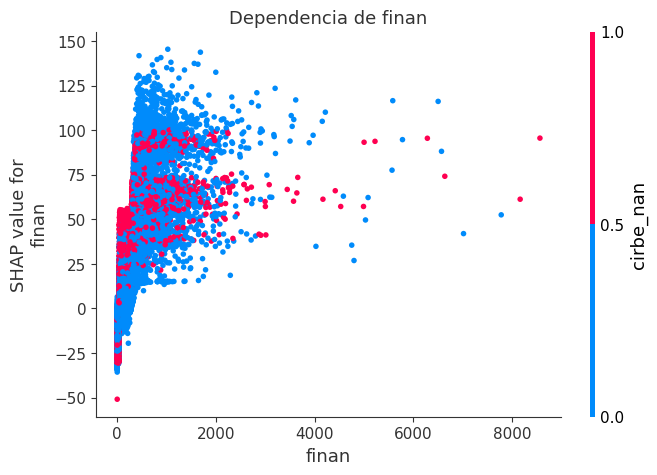

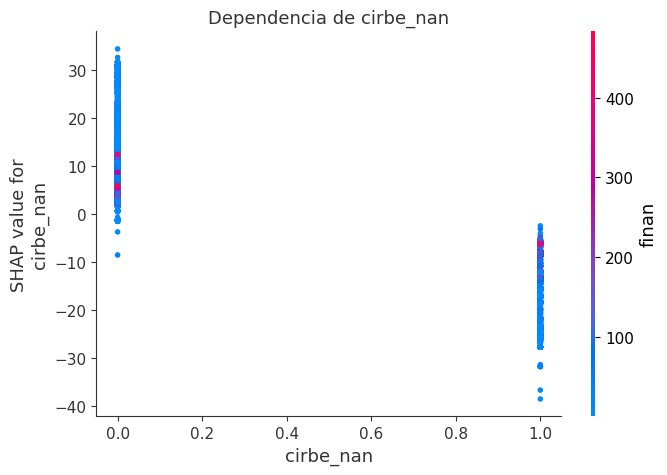

In [82]:
# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['impuestos']<20000]
X_clean = X_clean[X_clean['finan']<10000]
X_clean = X_clean[X_clean['prest']<10000]
X_clean = X_clean[X_clean['cirbe']<30000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['cirbe','finan','prest','finan','impuestos', 'cirbe_nan']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

## Impuestos

In [50]:
X_train = res['impuestos']['X_train']
y_train = res['impuestos']['y_train']
X_test = res['impuestos']['X_test']
y_test = res['impuestos']['y_test']

rf = res['impuestos']['model']

imp_feat = res['impuestos']['imp_feat']
imp_feat_perm = res['impuestos']['imp_feat_perm']


### Previsualización de datos

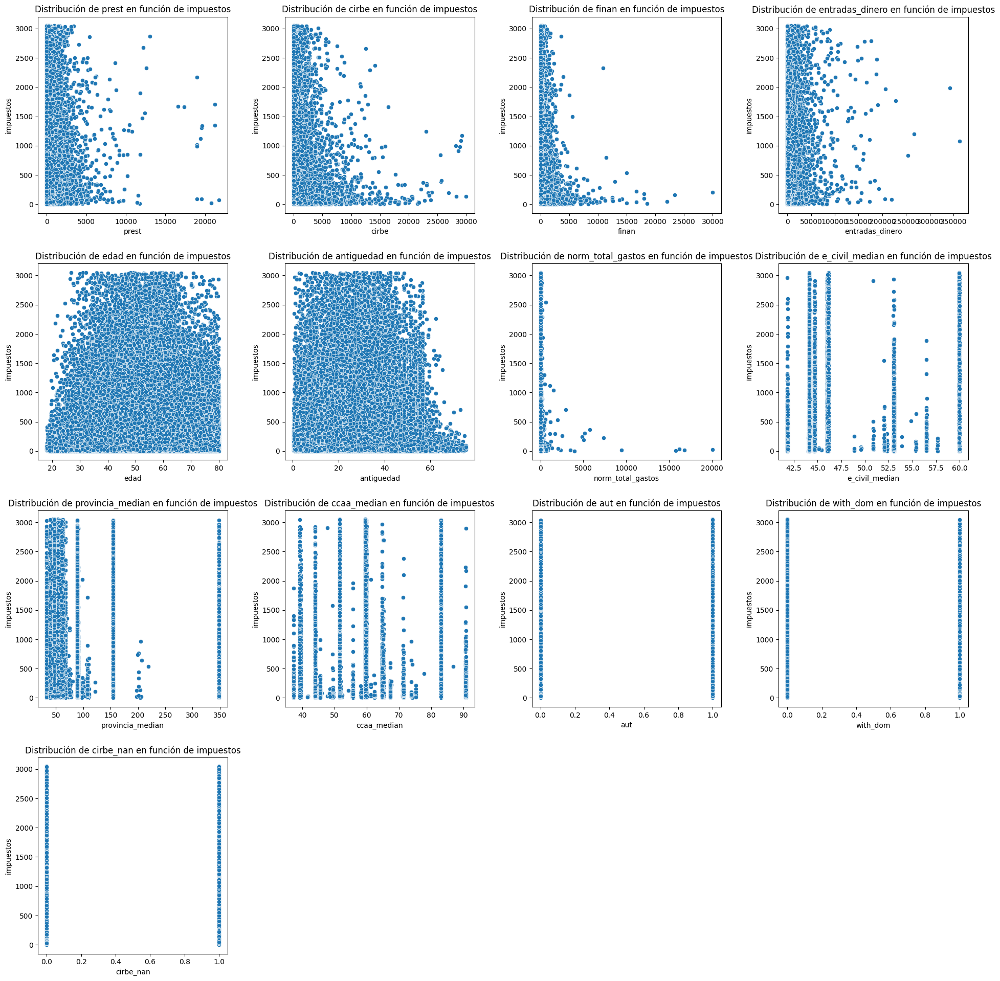

In [51]:
# Crear un DataFrame con los datos de entrenamiento
df_train = pd.DataFrame(X_train, columns=['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'])
df_train['impuestos'] = y_train
df = df_train[df_train['prest'] <= 30000]
df = df[df['cirbe'] <= 30000]
df = df[df['finan'] <= 40000]
df = df[df['entradas_dinero'] <= 400000]
df = df[df['norm_total_gastos'] <= 25000]
df = df[df['finan'] <= 40000]

# Lista de variables independientes
variables = ['prest', 'cirbe', 'finan', 'entradas_dinero', 'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median', 'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan']

# Número de variables
num_vars = len(variables)

# Crear una cuadrícula de subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

# Ajustar el layout
fig.tight_layout(pad=5.0)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Crear gráficos de dispersión en los subplots
for i, var in enumerate(variables):
    sns.scatterplot(x=df[var], y=df['impuestos'], ax=axes[i])
    axes[i].set_title(f'Distribución de {var} en función de impuestos')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('impuestos')

# Eliminar subplots vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

Aunque siguen siendo datos muy difíciles de analizar y predecir, parecen algo mejores que los anteriores.

### Feature Importance

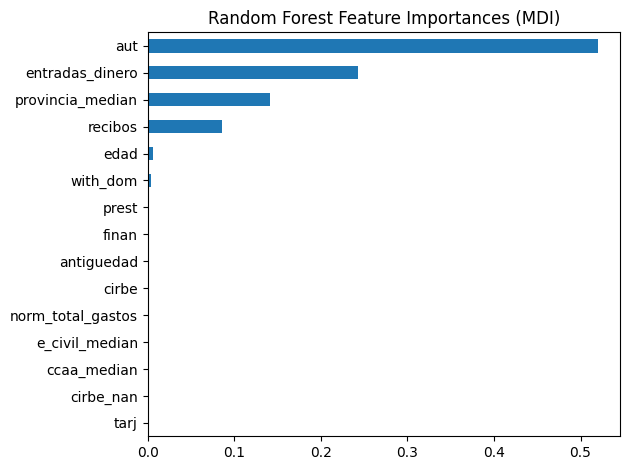

In [52]:
feature_names = imp_feat.keys()

mdi_importances = pd.Series(
    imp_feat.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

Podemos observar como el modelo predice principalmente en función de si es autónomo o no, de las entradas de dinero, de la provincia y de los recibos.

### Permutation Feature Importance

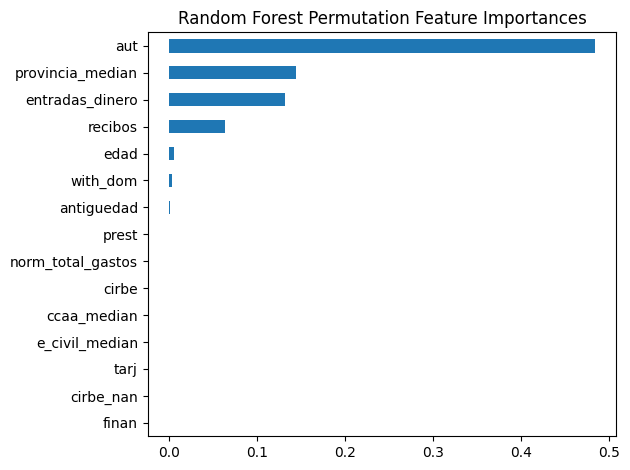

In [53]:
feature_names = imp_feat_perm.keys()

mdi_importances = pd.Series(
    imp_feat_perm.values, index=feature_names
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Permutation Feature Importances")
ax.figure.tight_layout()

Aquí si que parece un resultado mucho más acertado que los anteriores, el modelo predice mucho mejor pues alterar la relación de los datos sí que empeora significativamente el modelo. En particular vemos que la variable autónomo es muy importante para la precisión del modelo.

### PDP

In [54]:
rf.feature_names_in_

array(['prest', 'recibos', 'tarj', 'cirbe', 'finan', 'entradas_dinero',
       'edad', 'antiguedad', 'norm_total_gastos', 'e_civil_median',
       'provincia_median', 'ccaa_median', 'aut', 'with_dom', 'cirbe_nan'],
      dtype=object)

Variables a estudiar:

- aut --> 12
- provincia_median --> 10
- entradas_dinero --> 5
- recibos --> 1

In [55]:
#X_clean = X_train.copy()
#X_clean['aut'] = X_clean['aut'].apply(lambda x: 0 if x < 0.5 else 1)
#X_clean.describe(include='all')

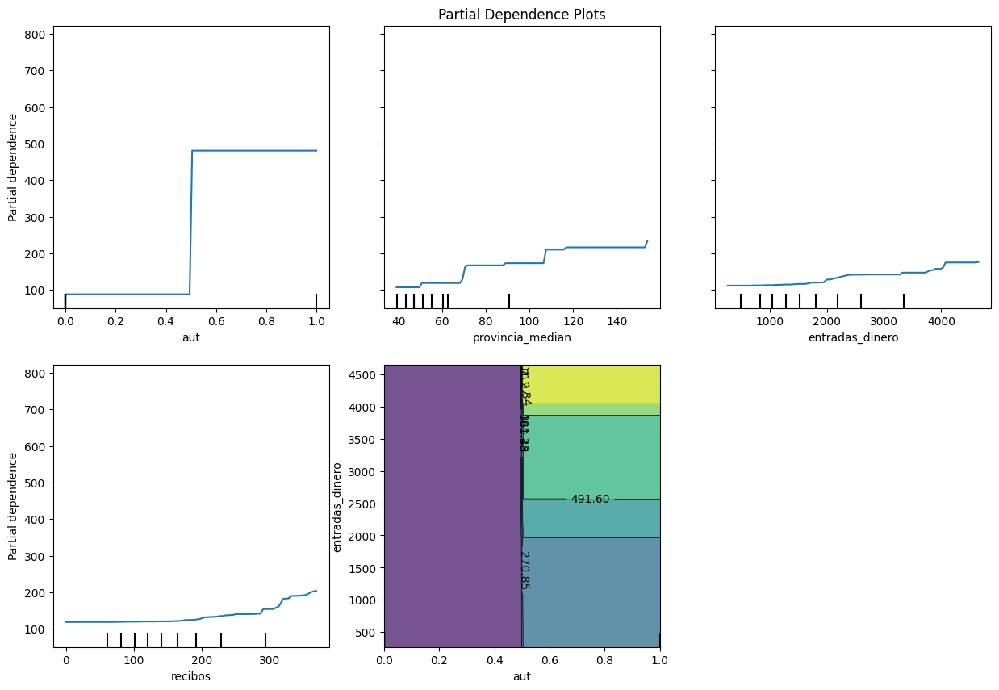

In [56]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=(12, 10, 5, 1, (12,5)), # the features to plot
    #categorical_features = [False]*12+[True]+[False]*2, # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

Vemos como afectan las variables principales, tras aplicar SHAP vi una clara relación muy importante para entender la predicción entre ser autónomo y la cantidad de dinero que entra. Por eso he añadido el PDP de las dos variables combinadas.

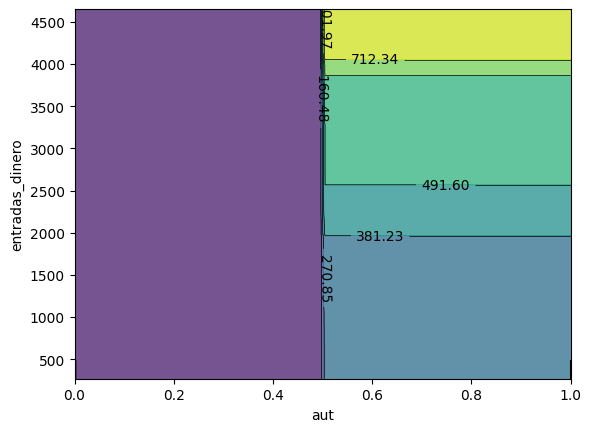

In [57]:
PartialDependenceDisplay.from_estimator(
    estimator=rf,
    X=X_train,
    features=[(12, 5)] # los features a graficar
    # categorical_features=[False]*12 + [True] + [False]*2 # features categóricos
)
plt.show()


Hablo más en detalle más adelante.

### SHAP

In [58]:
shap.initjs()

In [59]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP/impuestos_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP/impuestos_shap_values.npy', shap_values)

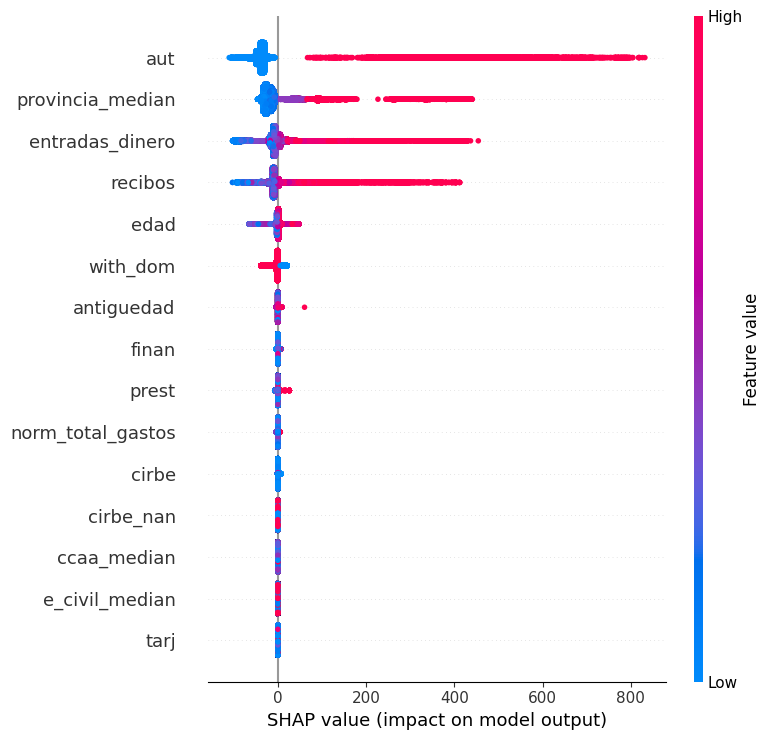

In [60]:
shap.summary_plot(shap_values, features=X_test, 
                   feature_names=rf.feature_names_in_)

Lo principal a comentar es lo siguiente:

- La mayoría de los no autónomos pagan los mismos impuestos y la diferencia en todo el conjunto no es demasiado alta. Sin embargo, ser autónomos aumenta la predicción de la cantidad a pagar y vemos que dentro de los autónomos si hay mucho más rango de variación.
- Para la provincia vemos que hay una gran cantidad de valores que no afectan a penas y luego parece que (lógico al ser una muestra) hay una relación clara.
- Para entradas de dinero y recibos es muy similar la intuición, hay cierto cúmulo de valores que el modelo no sabe (dudo que sea que no lo hagan) como afectan (SHAP values 0), pero en general cuanto mayor es el valor mayor es la estimación.

Por tanto la intuición general de como funciona el modelo es a partir de un valor base de los impuestos añade extras según las cuatro variables comentadas (los valores SHAP suelen ser positivos y hay pocos valores negativos).

In [61]:
#shap.force_plot(explainer.expected_value[0], shap_values, X_test)

# Submuestrear los datos
sample_size = 2000 
indices = np.random.choice(len(X_test), sample_size, replace=False)
X_test_sample = X_test.iloc[indices]
shap_values_sample = shap_values[indices]

# Generar el gráfico force plot con los datos submuestreados
shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample)

[Force Plot Impuestos](SHAP/impuestos_force_plot.html)

In [62]:
# Guardar el gráfico como un archivo HTML
shap.save_html('SHAP/impuestos_force_plot.html', shap.force_plot(explainer.expected_value[0], shap_values_sample, X_test_sample))

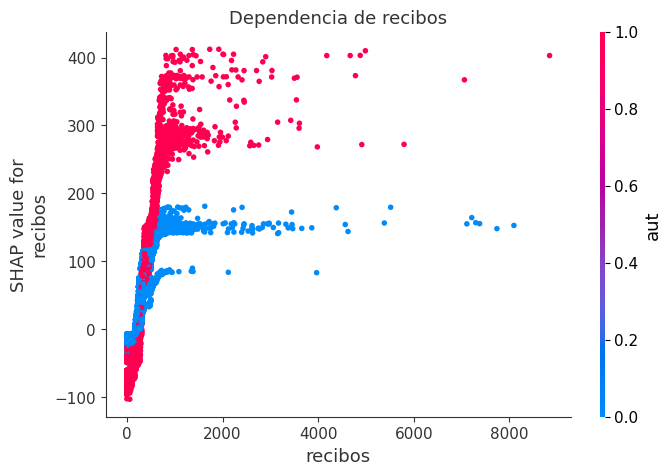

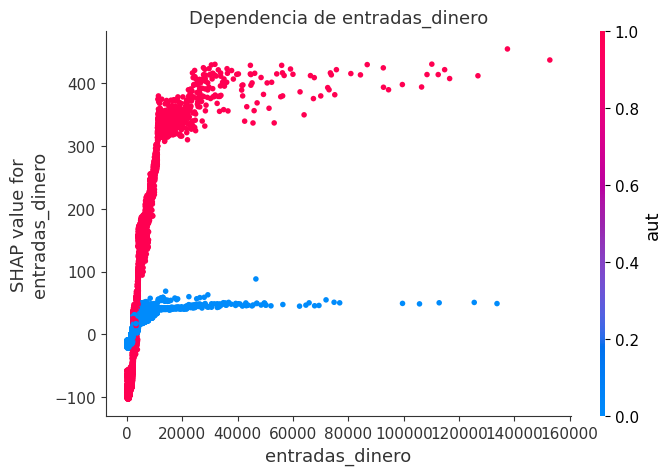

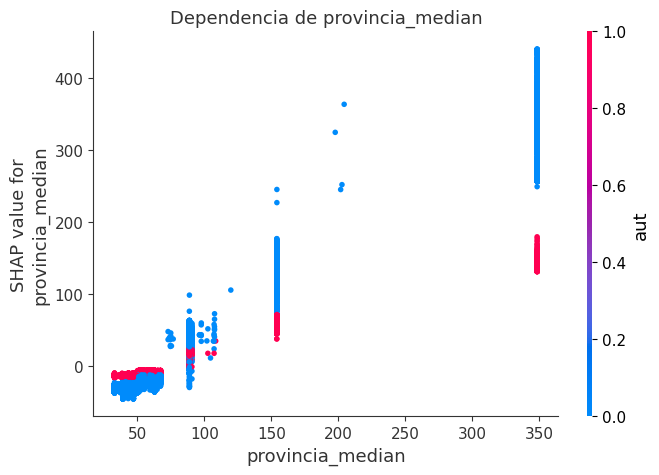

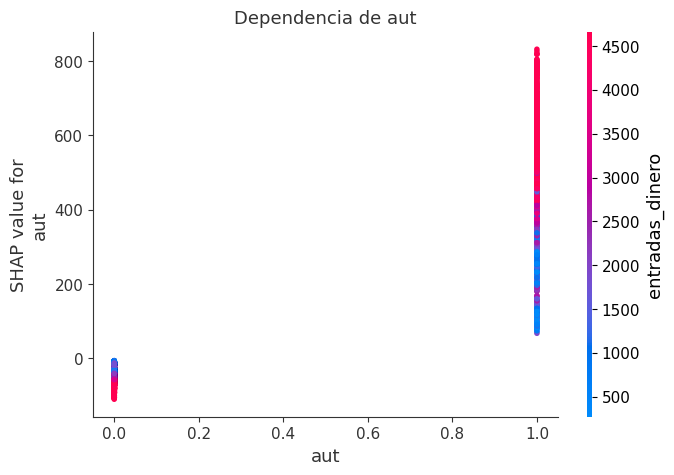

In [63]:
# Sample 1000 background data samples
#background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
#np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(rf, approximate=True)

X_clean = X_test.copy()
X_clean = X_clean[X_clean['recibos']<10000]
X_clean = X_clean[X_clean['entradas_dinero']<200000]

# Calculate SHAP values
shap_values = explainer.shap_values(X_clean)

# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
feature_names = rf.feature_names_in_

feature_list=['aut','provincia_median','entradas_dinero','recibos']

for feature_index, feature_name in enumerate(feature_names):
    if feature_name in feature_list:
        shap.dependence_plot(
            feature_index, 
            shap_values, 
            features=X_clean, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name}"
        )

plt.show()

La conclusión general de estos gráficos es que es fácil entender porque ser autónomo es la variable más importante y la que más afecta al modelo, pues los SHAP values de todas las variables importantes se ven afectados por ser autónomo o no. 